In [28]:
import numpy as np   
import torch
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt

from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from torch.distributions import Categorical
from torchvision import datasets, transforms
from torch.autograd import Variable

In [29]:
device = torch.device('cuda')
print(device)

cuda


In [30]:
train_dataset = datasets.MNIST('./data', train=True, download=True, transform=transforms.ToTensor())
test_dataset = datasets.MNIST('./data', train=False, download=True, transform=transforms.ToTensor())

print(len(train_dataset), len(test_dataset))

60000 10000


In [31]:
x_plot, y_plot = zip(*torch.utils.data.Subset(test_dataset, range(16)))
x_plot, y_plot = torch.stack(x_plot), torch.as_tensor(y_plot, device=device)
x_plot = x_plot.to(device)

In [32]:
x_plot.shape

torch.Size([16, 1, 28, 28])

---
## VQ-VAE

Adopted from: https://github.com/zalandoresearch/pytorch-vq-vae/blob/master/vq-vae.ipynb

In [33]:
class VQ(nn.Module):
    
    def __init__(self, num_embeddings, embedding_size, commitment_cost):
        super().__init__()
        self.num_embeddings = num_embeddings
        self.embedding_size = embedding_size
        self.commitment_cost = commitment_cost
        
        self.embedding = nn.Embedding(num_embeddings, embedding_size)
        self.embedding.weight.data.uniform_(-1. / num_embeddings, 1. / num_embeddings)
    
    def forward(self, x):
        x = x.permute(0, 2, 3, 1).contiguous()  # from BCHW to BHWC
        x_flat = x.view(-1, self.embedding_size)
        
        w = self.embedding.weight
        distances = torch.sum(x_flat ** 2, dim=1, keepdim=True) + torch.sum(w ** 2, dim=1) - 2 * (x_flat @ w.T)

        indices_flat = torch.argmin(distances, dim=1, keepdim=True)
        quantized_flat = self.embed(indices_flat)
        
        quantized = quantized_flat.view(x.shape)
        indices = indices_flat.view(*x.shape[:3]).unsqueeze(dim=1)  # BHW to BCHW
        
        # To implemtent the stop gradients and pass through of gradients you have to put detach() at the right positions
        if self.training:

            e_latent_loss = F.mse_loss(quantized.detach(), x)
            q_latent_loss = F.mse_loss(quantized, x.detach())

            loss = q_latent_loss + self.commitment_cost * e_latent_loss
        
            quantized = x + (quantized - x).detach()
        else:
            loss = 0.
        
        quantized = quantized.permute(0, 3, 1, 2).contiguous()  # from BHWC to BCHW
        
        return quantized, indices, loss
    
    def embed(self, indices):
        quantized = self.embedding(indices)
        return quantized

In [34]:
class ResBlock(nn.Module):
    
    def __init__(self, in_channels, hidden_channels, stride=1, padding_1=1, padding_2=0):
        super().__init__()
        self.stride = stride
        self.conv1 = nn.Conv2d(in_channels, hidden_channels, kernel_size=3, stride=stride, padding=padding_1, bias=False)
        self.conv2 = nn.Conv2d(hidden_channels, in_channels, kernel_size=1, stride=stride, padding=padding_2, bias=False)

    def forward(self, x):
        input_x = x
        x = self.conv1(F.relu(x))
        x = self.conv2(F.relu(x))

        return x + input_x

In [35]:
class VQVAE(nn.Module):
    
    def __init__(self, in_channels, num_embeddings, embedding_size, res_hidden_channels, decoder_bn,
                 commitment_cost, res_stride=1):
        super().__init__()
        self.in_channels = in_channels
        self.num_embeddings = num_embeddings
        self.embedding_size = embedding_size
        
        h = embedding_size
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, h, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(h),
            nn.ReLU(inplace=True),
            nn.Conv2d(h, h, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(h),
            ResBlock(h, res_hidden_channels, stride=res_stride),
            nn.BatchNorm2d(h),
            ResBlock(h, res_hidden_channels, stride=1),
            nn.BatchNorm2d(h)
        )
        
        self.vq = VQ(num_embeddings, embedding_size, commitment_cost)
        
        if decoder_bn:
            self.decoder = nn.Sequential(
                ResBlock(h, res_hidden_channels, stride=1),
                nn.BatchNorm2d(h),
                ResBlock(h, res_hidden_channels, stride=res_stride),
                nn.BatchNorm2d(h),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, h, kernel_size=4, stride=2, padding=1),
                nn.BatchNorm2d(h),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, in_channels, kernel_size=4, stride=2, padding=1)
            )
        else:
            self.decoder = nn.Sequential(
                ResBlock(h, res_hidden_channels, stride=1),
                ResBlock(h, res_hidden_channels, stride=res_stride),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, h, kernel_size=4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, in_channels, kernel_size=4, stride=2, padding=1)
            )
    
    def forward(self, x):
        z = self.encode(x)

        quantized, indices, vq_loss = self.quantize(z)
        x_recon = self.decode(quantized)
        return x_recon, quantized, indices, vq_loss
    
    def encode(self, x):
        z = self.encoder(x)
        return z
    
    def quantize(self, z):
        quantized, indices, vq_loss = self.vq(z)
        return quantized, indices, vq_loss
    
    def decode(self, quantized):
        x_recon = self.decoder(quantized)
        return x_recon
    
    def embed(self, indices):
        return self.vq.embed(indices)

In [36]:
def plot_latents(model):
    model.eval()
    with torch.no_grad():
        x_recon, quantized, indices, _ = model(x_plot)
    
    fig, axes = plt.subplots(1, 3, figsize=(16,4))
    
    axes[0].set_title('Original images')
    axes[0].imshow(torchvision.utils.make_grid(1 - x_plot, nrow=4, pad_value=1).permute(1, 2, 0).cpu().numpy())
    axes[0].axis('off')
    
    axes[1].set_title('Latent representation')
    axes[1].imshow(torchvision.utils.make_grid(
        indices.float() / (model.num_embeddings - 1),
        nrow=4, pad_value=1).permute(1, 2, 0).cpu().numpy())
    axes[1].axis('off')
    
    axes[2].set_title('Reconstructed images')
    axes[2].imshow(torchvision.utils.make_grid(
        torch.clamp(1 - x_recon, 0., 1.), nrow=4, pad_value=1).permute(1, 2, 0).cpu().numpy())
    axes[2].axis('off')

In [37]:
def train_vqvae(num_embeddings, embedding_size, res_hidden_channels, decoder_bn,
                commitment_cost, num_epochs, batch_size, lr, plot_final_only=False, res_stride=1, model=None):
    
    if model is None:
        model = VQVAE(1, num_embeddings, embedding_size, res_hidden_channels, decoder_bn, commitment_cost, res_stride=res_stride)
        model.to(device)
    
    optimizer = optim.Adam(model.parameters(), lr)
    
    dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    hist = []
    for epoch in range(num_epochs):
        model.train()
        epoch_hist = []
        for x, y in dataloader:
            x = x.to(device)
            
            optimizer.zero_grad()
            x_recon, quantized, encoding_indices, vq_loss = model(x)
            recon_loss = F.mse_loss(x_recon, x)
            loss = vq_loss + recon_loss
            loss.backward()
            optimizer.step()
            
            epoch_hist.append((loss.item(), recon_loss.item(), vq_loss.item()))
        
        losses, recon_losses, vq_losses = zip(*epoch_hist)
        hist.append((np.mean(losses), np.mean(recon_losses), np.mean(vq_losses)))
        
        if not plot_final_only and (epoch % 5 == 0 or epoch == num_epochs - 1):
            print(f'Epoch {epoch + 1}')
            plot_latents(model)
            plt.show()
    
    if plot_final_only:
        plot_latents(model)
        plt.show()
    
    xs = np.arange(1, num_epochs + 1)
    losses, recon_losses, vq_losses = zip(*hist)
    
    plt.title('Loss history')
    plt.xticks(xs)
    plt.plot(xs, losses, marker='o', label='total')
    plt.plot(xs, recon_losses, marker='o', label='reconstruction')
    plt.plot(xs, vq_losses, marker='o', label='vq')
    plt.legend()
    
    return model

### Try different latent sizes

#### num_embeddings=2, embedding_size=1

#### num_embeddings=2, embedding_size=4

#### num_embeddings=2, embedding_size=16

#### num_embeddings=4, embedding_size=16




### num_embeddings=2, embedding_size=1

Epoch 1


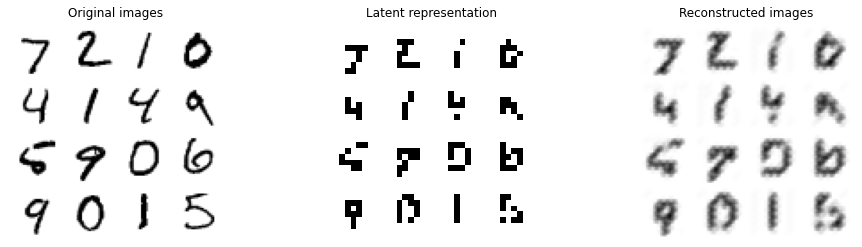

Epoch 6


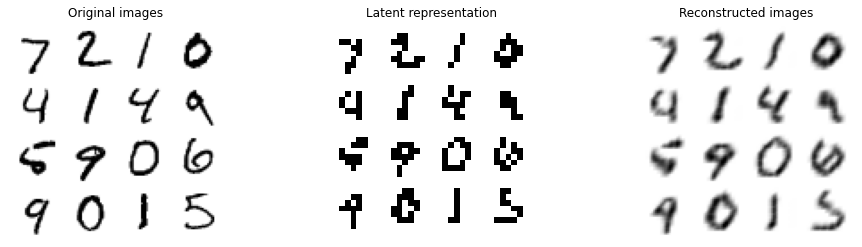

Epoch 11


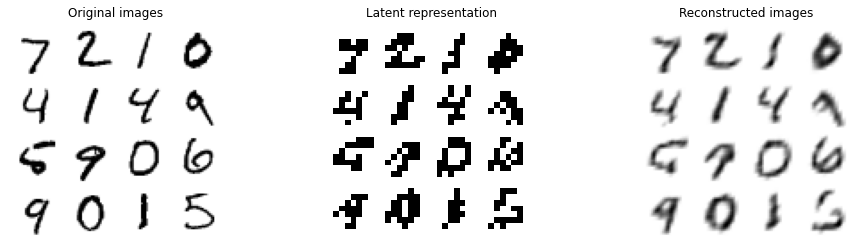

Epoch 16


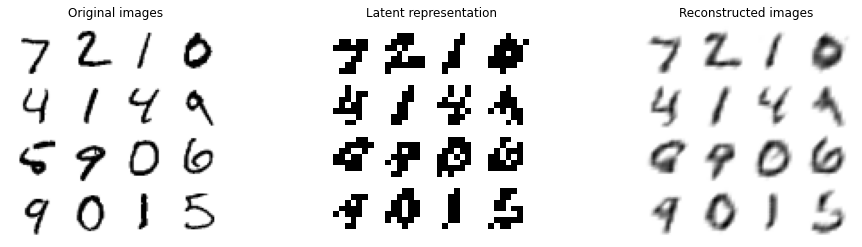

Epoch 21


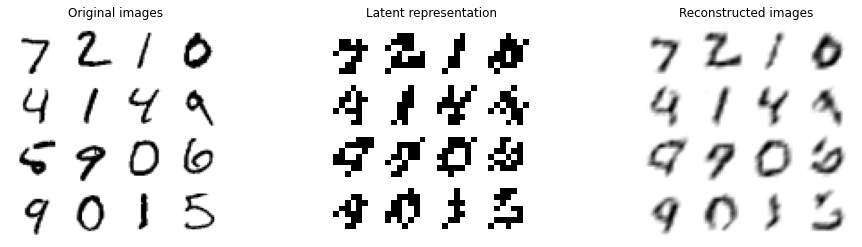

Epoch 26


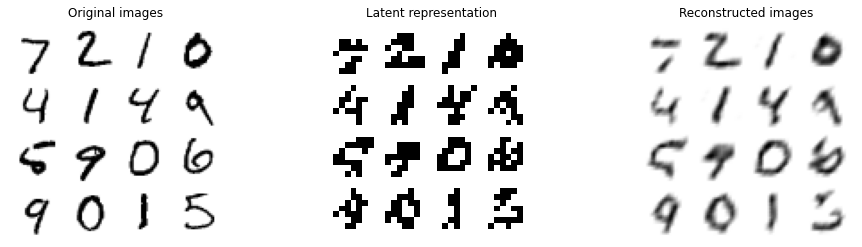

Epoch 31


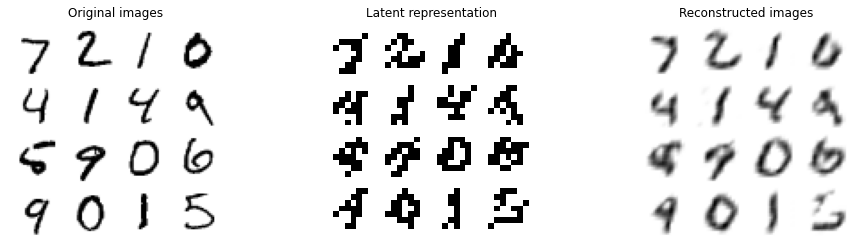

Epoch 36


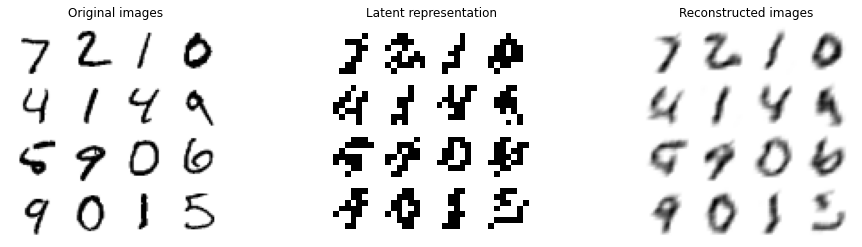

Epoch 41


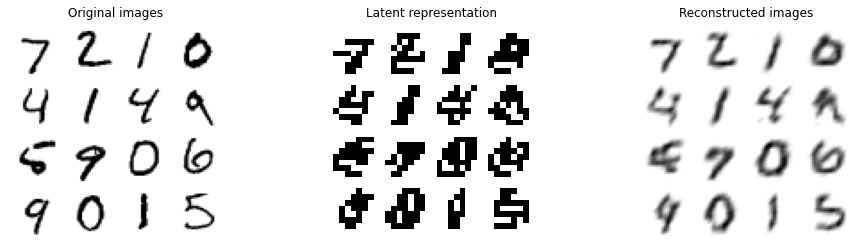

Epoch 46


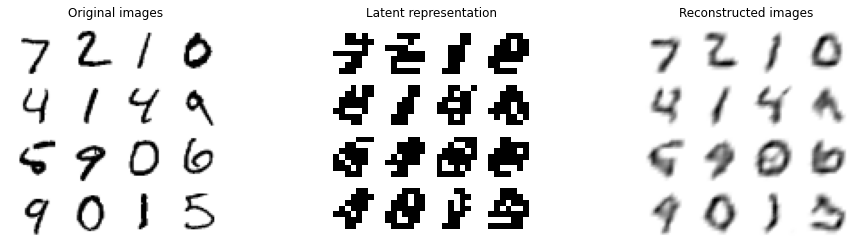

Epoch 50


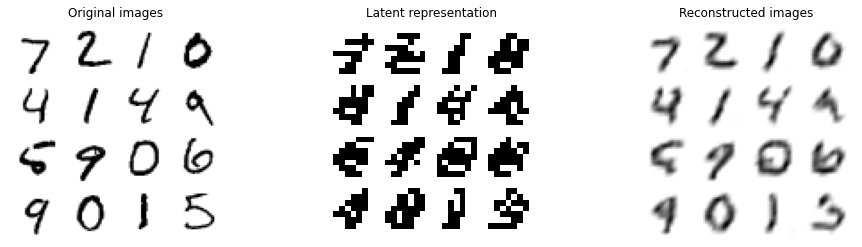

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(2, 1)
  )
  (

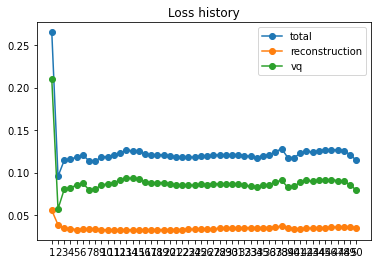

In [13]:
train_vqvae(num_embeddings=2, embedding_size=1, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False)

### num_embeddings=2, embedding_size=4

Epoch 1


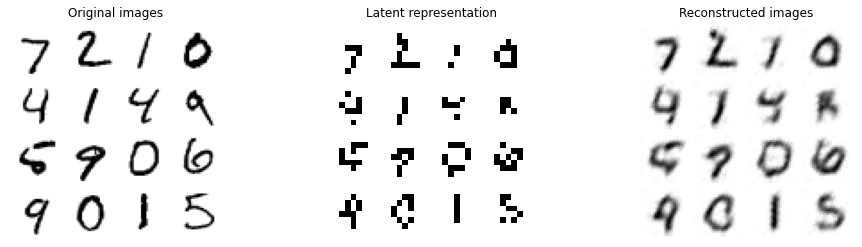

Epoch 6


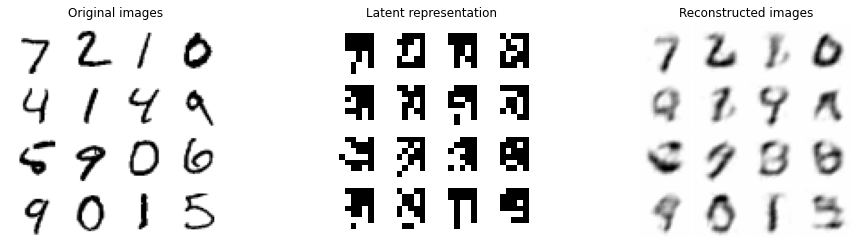

Epoch 11


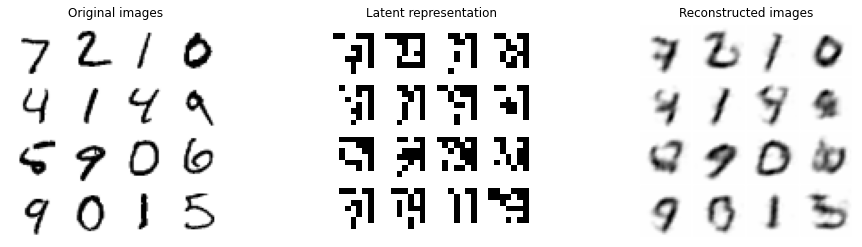

Epoch 15


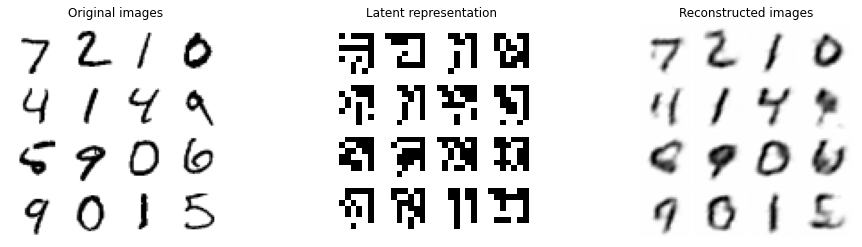

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(4, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(4, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(4, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(2, 4)
  )
  (

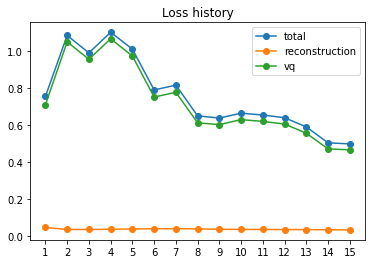

In [18]:
train_vqvae(num_embeddings=2, embedding_size=4, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=15, batch_size=32, lr=1e-3, plot_final_only=False)

### num_embeddings=2, embedding_size=16

Epoch 1


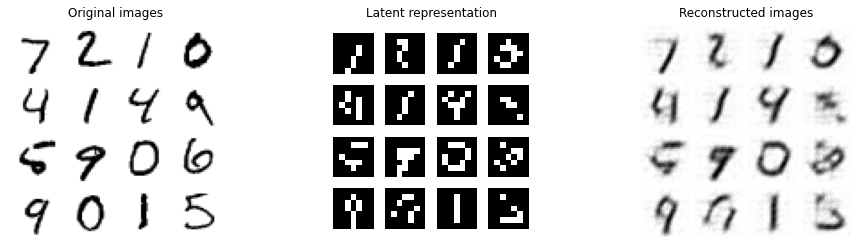

Epoch 6


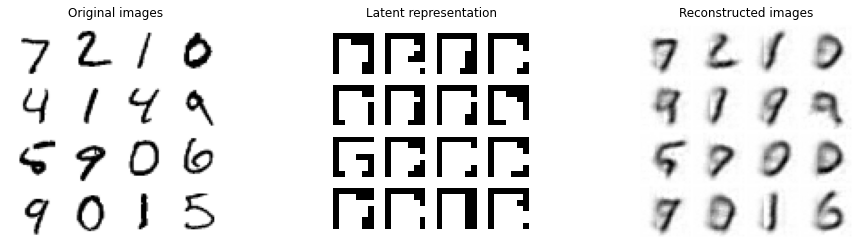

Epoch 11


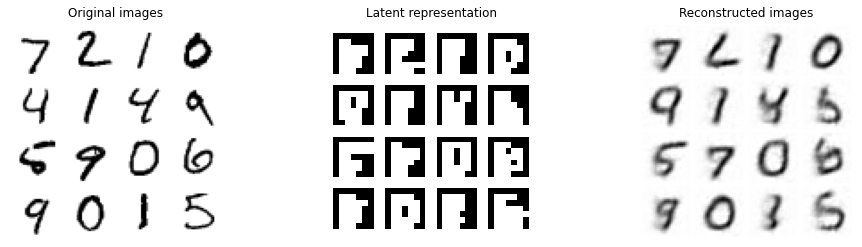

Epoch 16


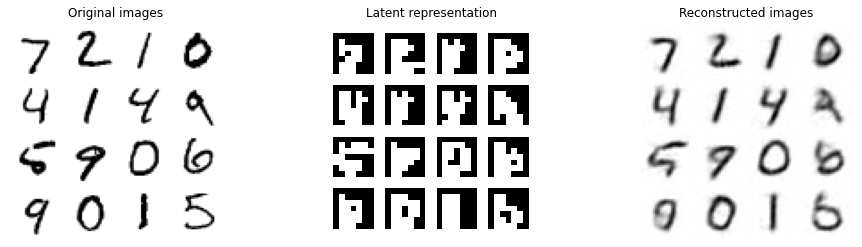

Epoch 20


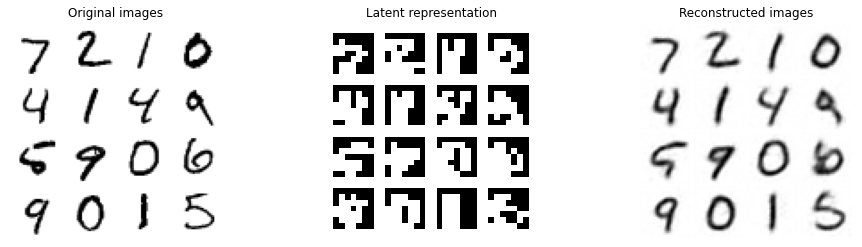

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(16, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(2,

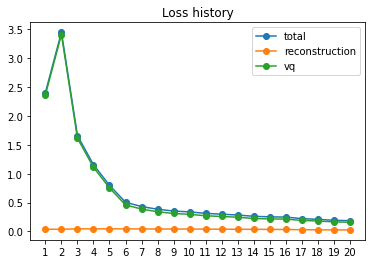

In [21]:
train_vqvae(num_embeddings=2, embedding_size=16, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=20, batch_size=32, lr=1e-3, plot_final_only=False)

### num_embeddings=4, embedding_size=8

Epoch 1


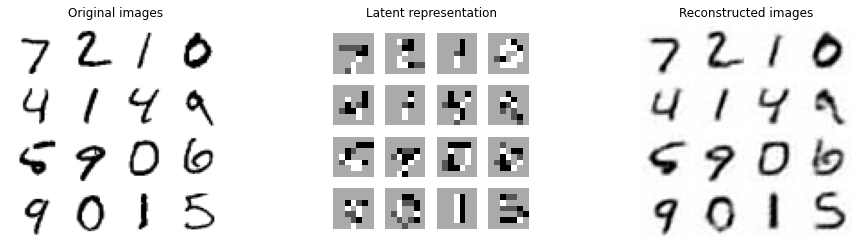

Epoch 6


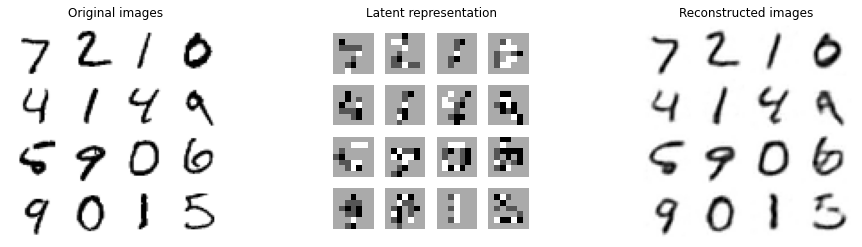

Epoch 11


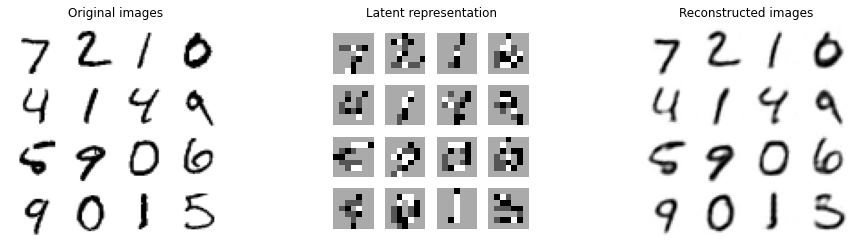

Epoch 16


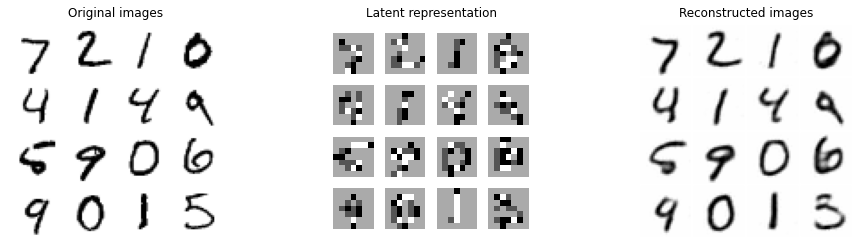

Epoch 20


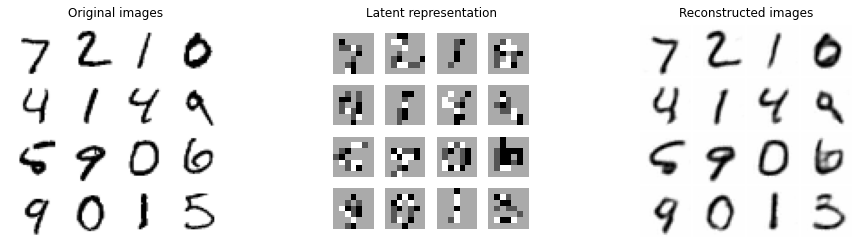

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(8, 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(4, 8)
  )
  (

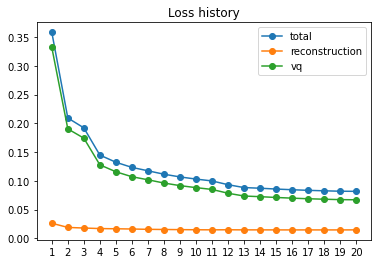

In [203]:
train_vqvae(num_embeddings=4, embedding_size=8, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=20, batch_size=32, lr=1e-3, plot_final_only=False)

### num_embeddings=4, embedding_size=16

Epoch 1


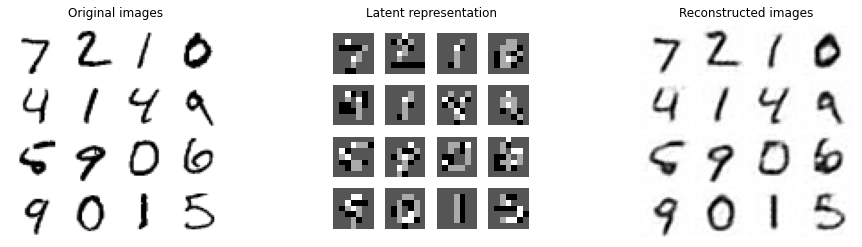

Epoch 6


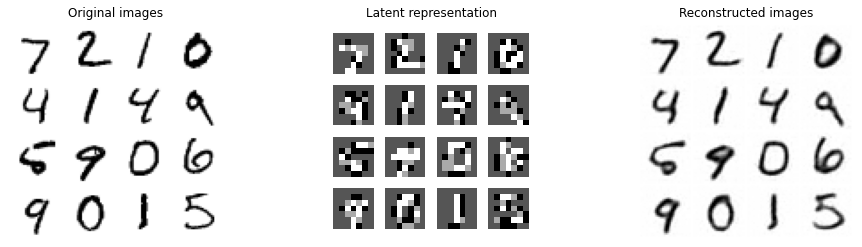

Epoch 11


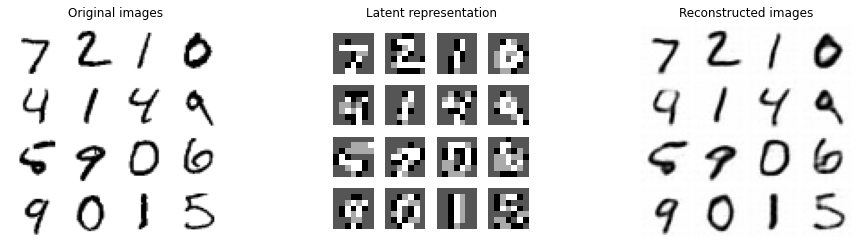

Epoch 16


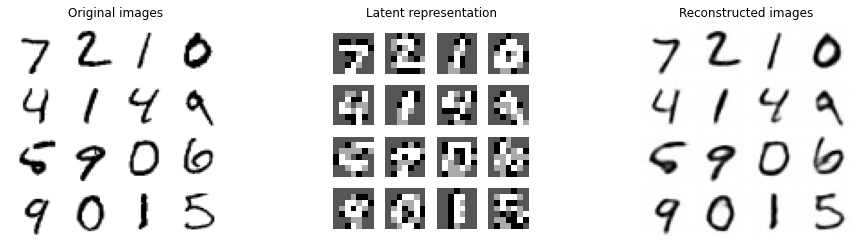

Epoch 21


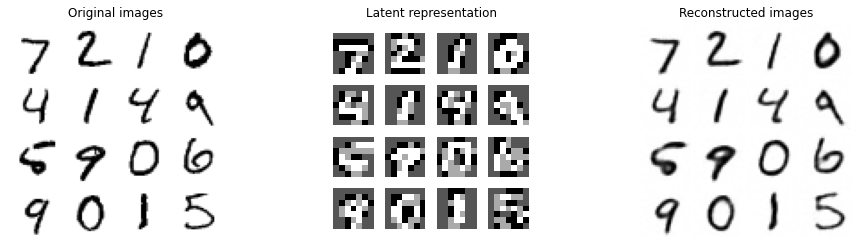

Epoch 26


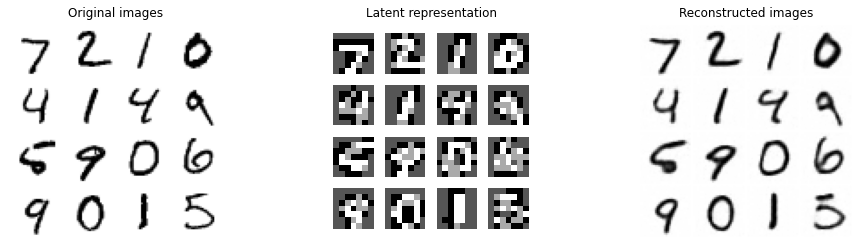

Epoch 31


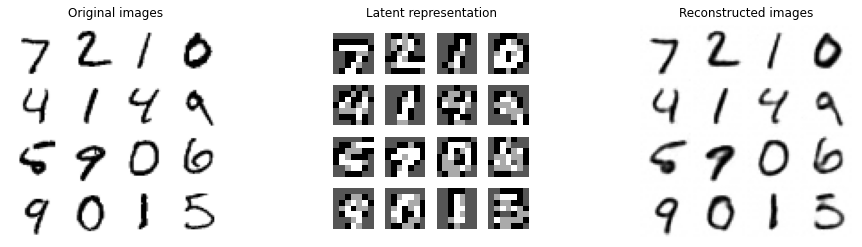

Epoch 36


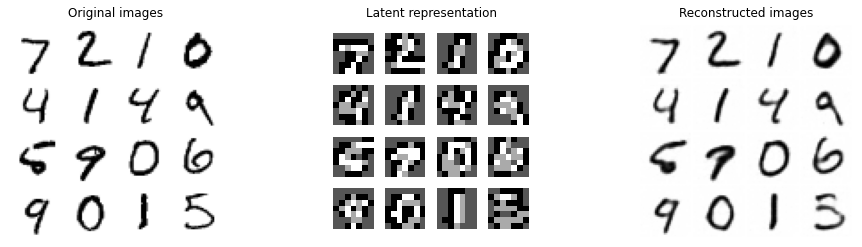

Epoch 41


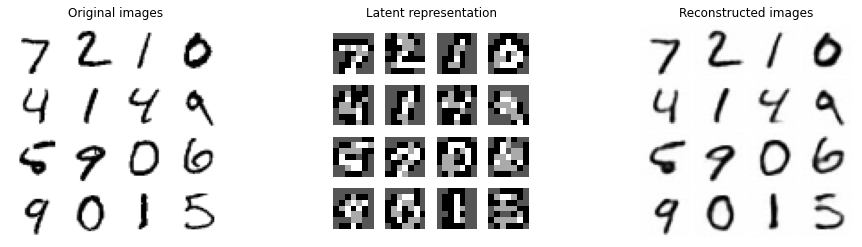

Epoch 46


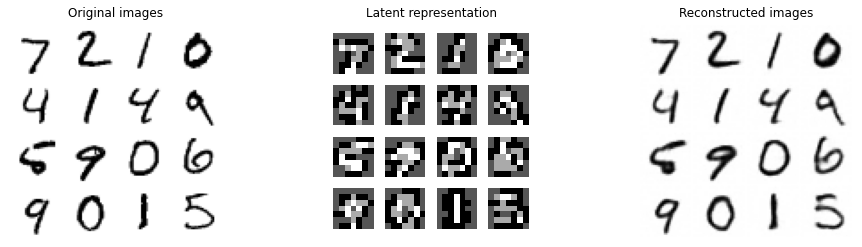

Epoch 50


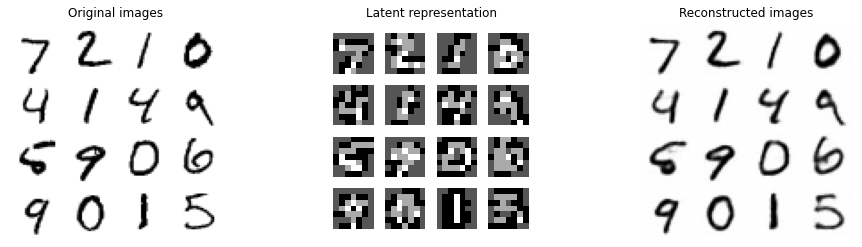

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(16, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(4,

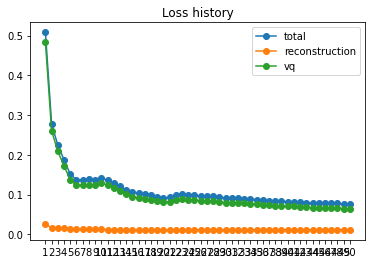

In [20]:
train_vqvae(num_embeddings=4, embedding_size=16, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False)

### Smaller amount of hidden channels

Epoch 1


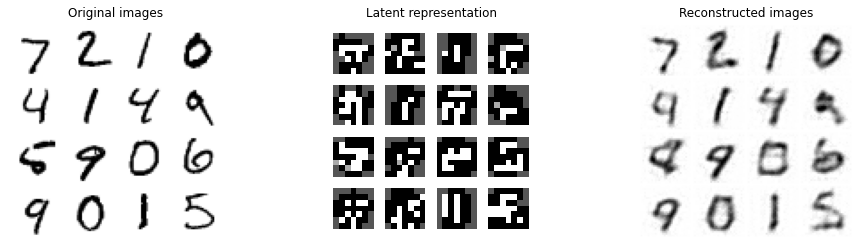

Epoch 6


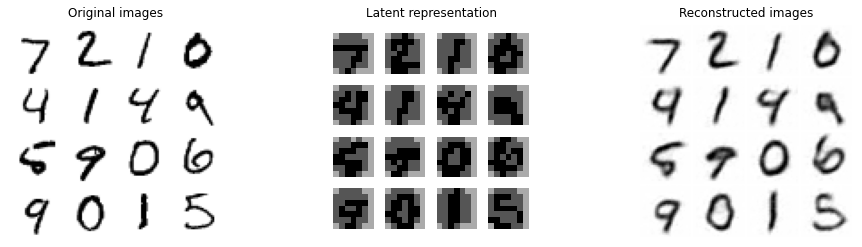

Epoch 11


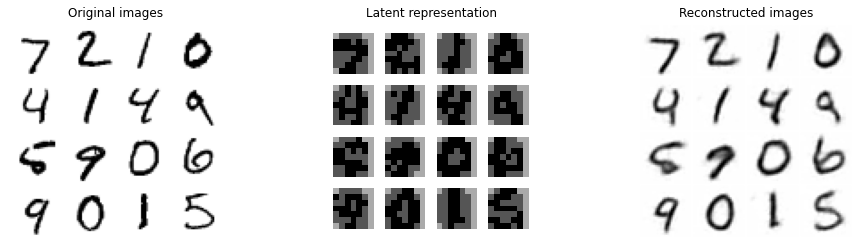

Epoch 16


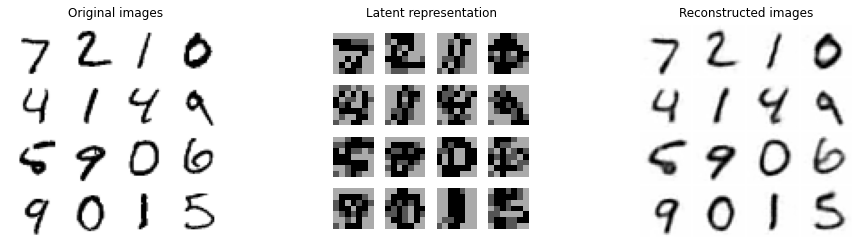

Epoch 21


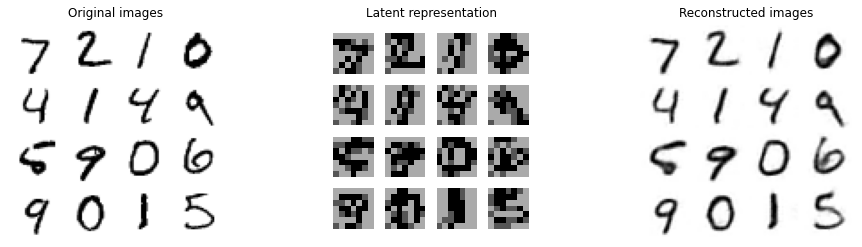

Epoch 26


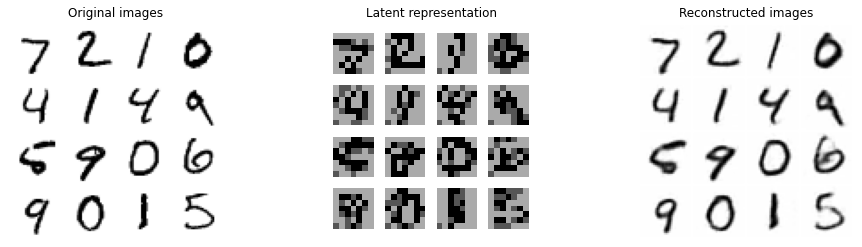

Epoch 31


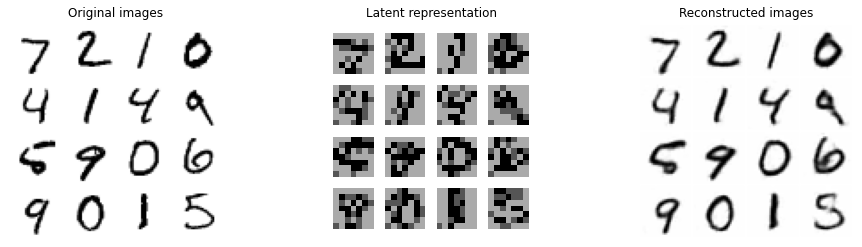

Epoch 36


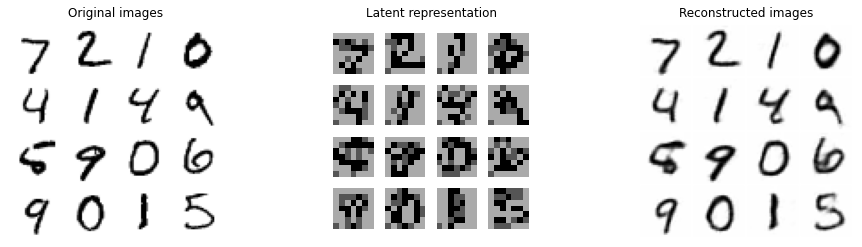

Epoch 41


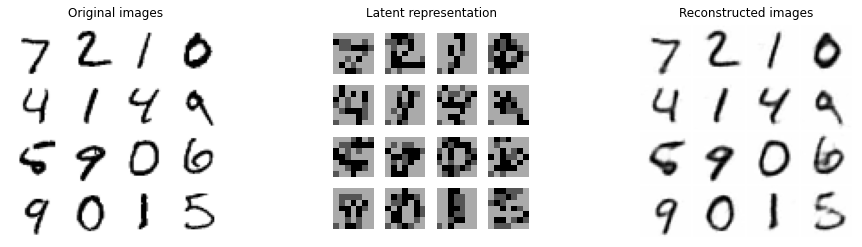

Epoch 46


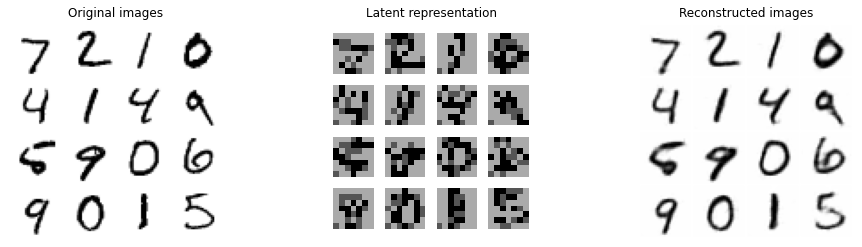

Epoch 50


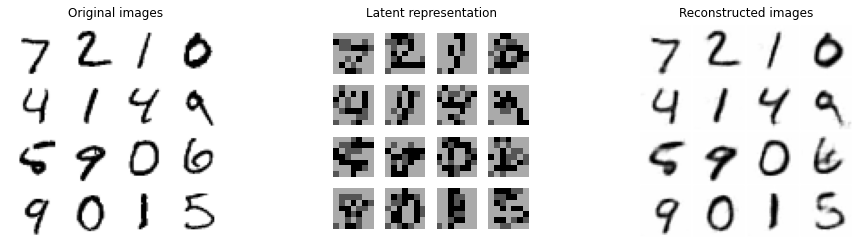

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(16, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(4,

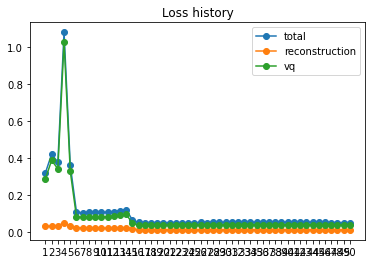

In [187]:
train_vqvae(num_embeddings=4, embedding_size=16, res_hidden_channels=16, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False)

In [ ]:
train_vqvae(num_embeddings=2, embedding_size=16, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=20, batch_size=32, lr=1e-3, plot_final_only=False)
model = VQVAEStrided(1, 4, 16, 32, True, 0.2, res_stride=1)

### Embedding size of 1

Epoch 1


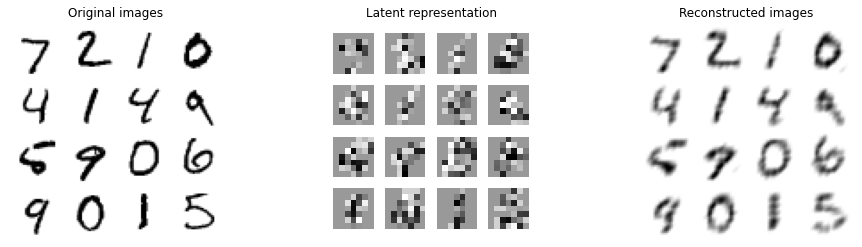

Epoch 6


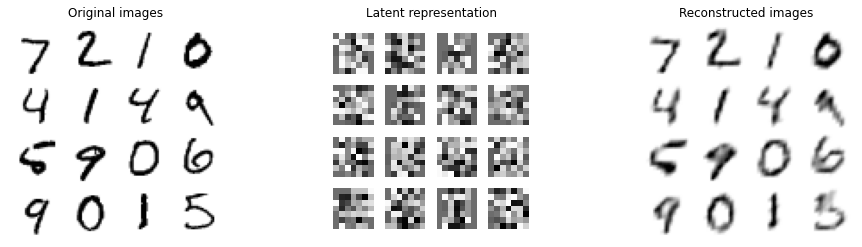

Epoch 11


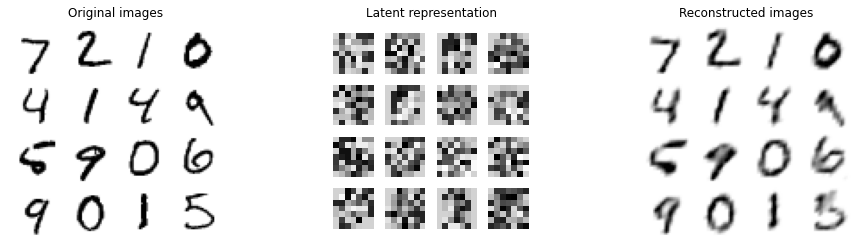

Epoch 16


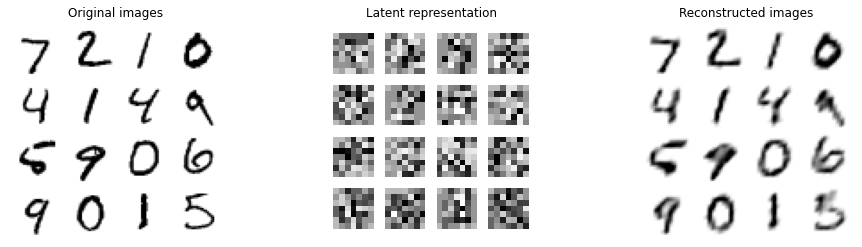

Epoch 21


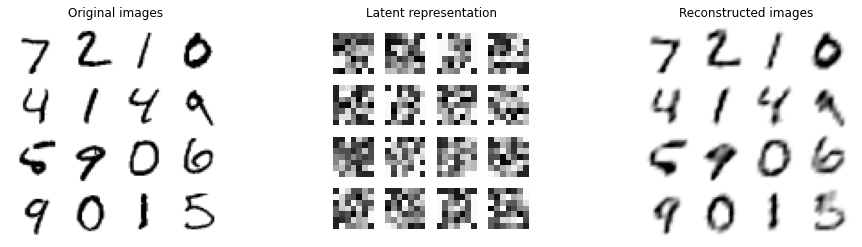

Epoch 26


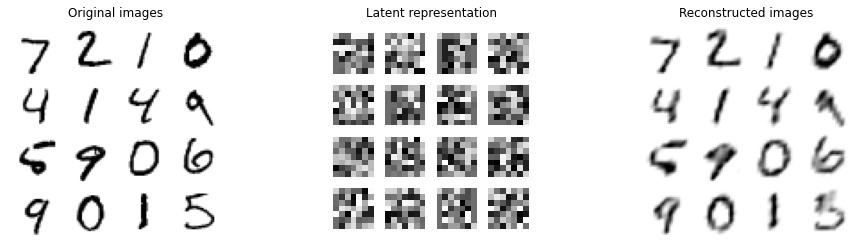

Epoch 31


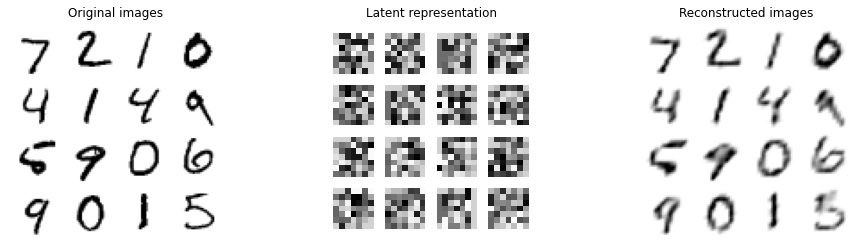

Epoch 36


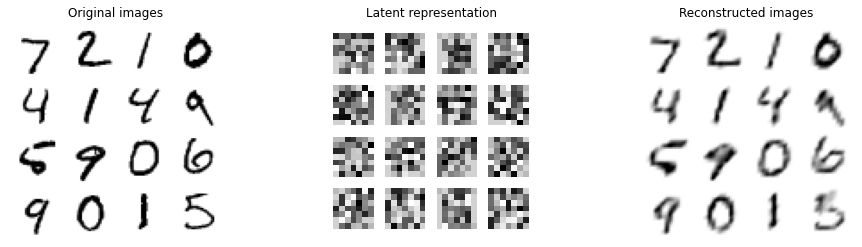

Epoch 41


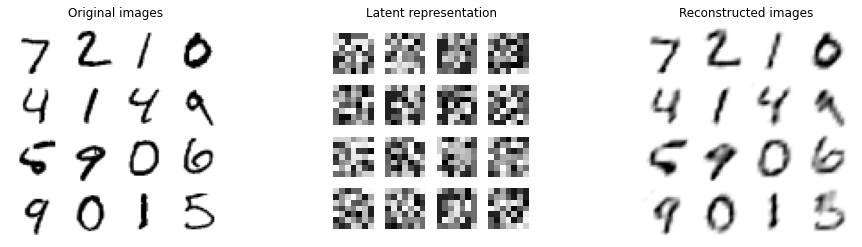

Epoch 46


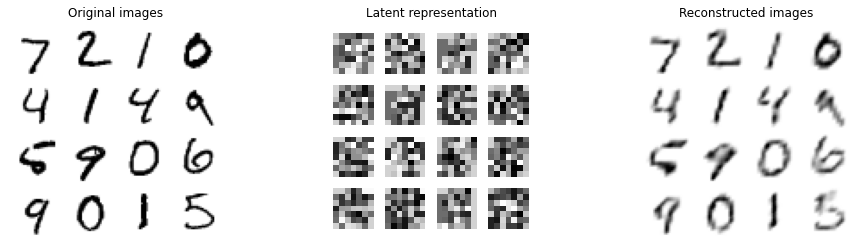

Epoch 50


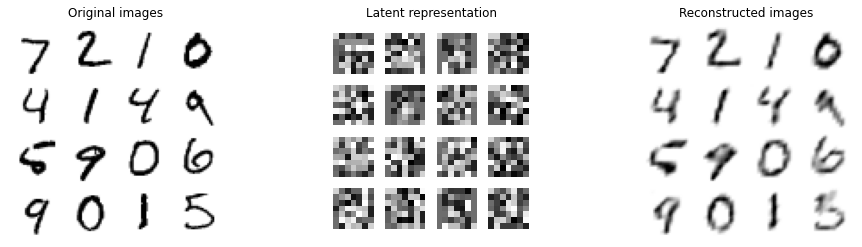

VQVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(1, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(32, 1, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embedding(64, 1)
  )
  

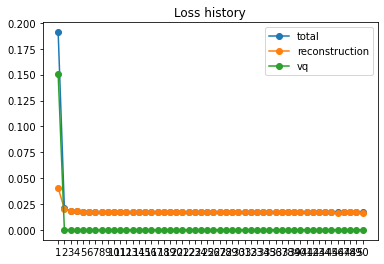

In [204]:
train_vqvae(num_embeddings=64, embedding_size=1, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False)

Epoch 1


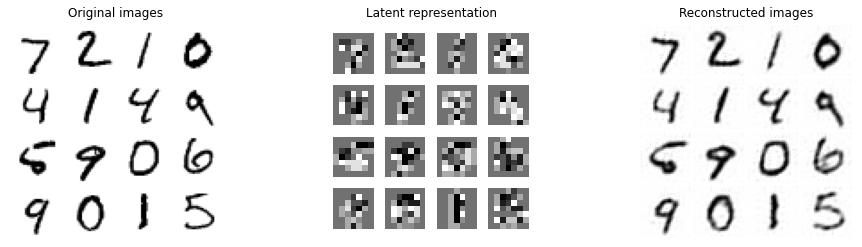

Epoch 6


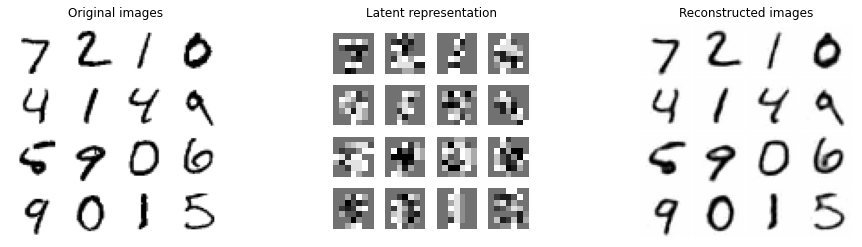

Epoch 11


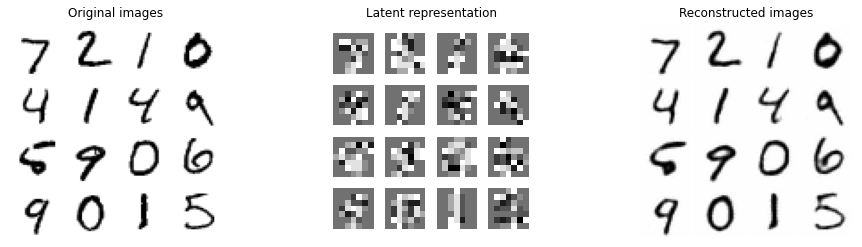

Epoch 16


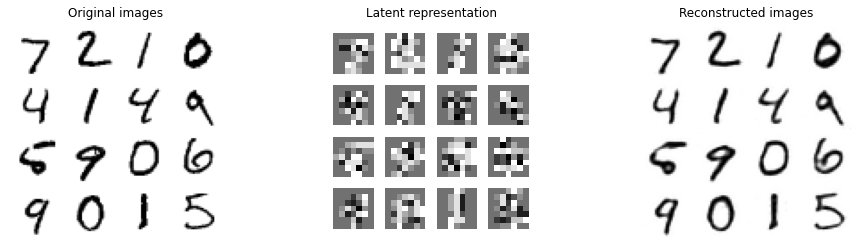

Epoch 21


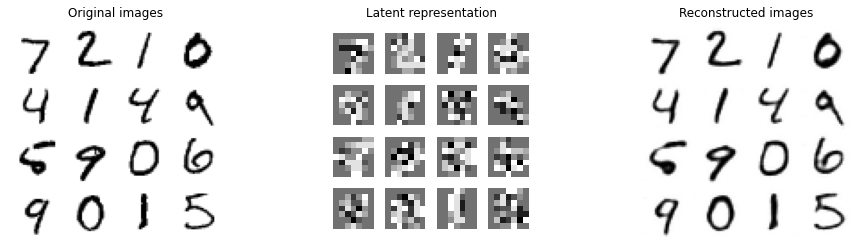

Epoch 26


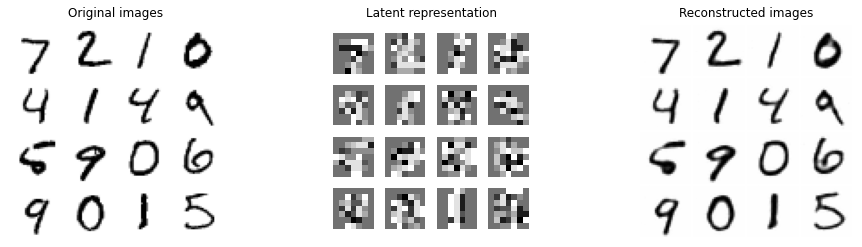

Epoch 31


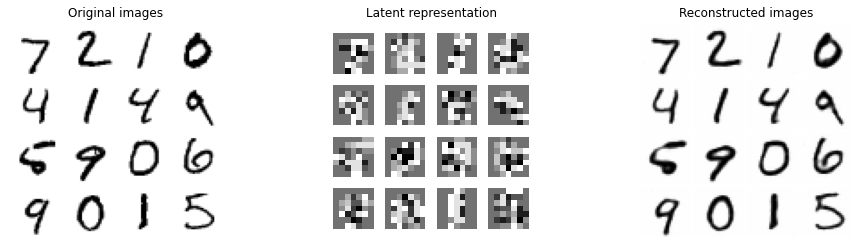

Epoch 36


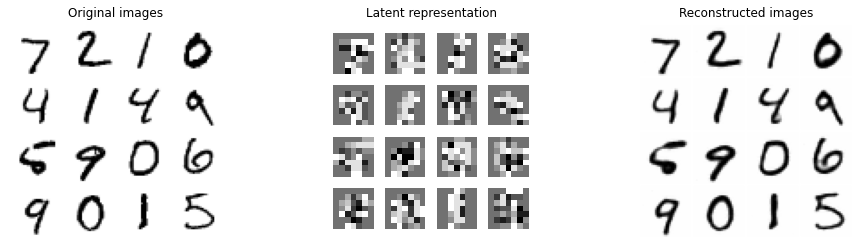

Epoch 41


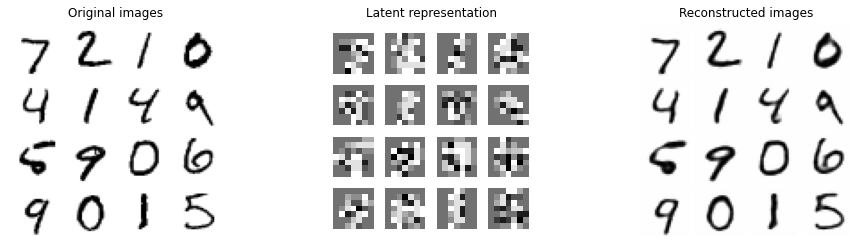

Epoch 46


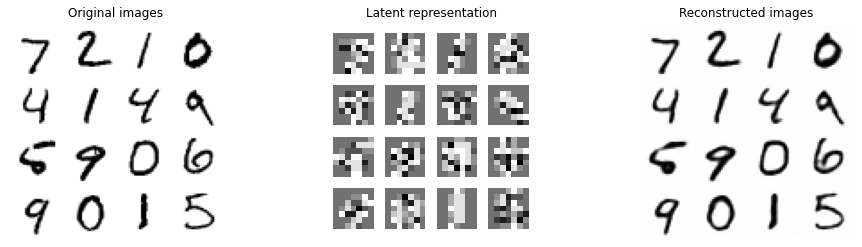

Epoch 50


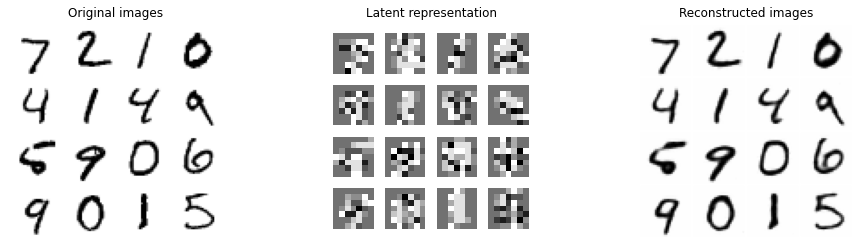

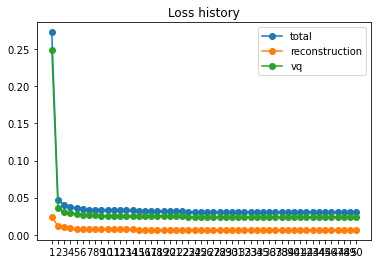

In [39]:
vqvae = train_vqvae(num_embeddings=10, embedding_size=8, res_hidden_channels=32, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False)

In [40]:
torch.save(vqvae.state_dict(),'/home/syslink/Documents/gm/ex4/final_vqvae.pt')

### Find a candidate forthe smallest latent space representation that still gives accurate reconstructions
The best one was with num_embeddings=4, embedding_size=8, however results with num_embeddings=2 are also quite appropriate.
We can also reduce the size by using smaller amount of hidden layers of by adding bigger stride to convolutions in the beginning. As we can see the results are still pretty decent. 

### Why we shouldtake the embedding size (dimension of embedding vectors) larger than one for MNIST?
If to look as the dimension of the embedding vectors as the features which we learn from the data, then when we have a size of 1, then we have 2 bits of information, which might be interpreted like horizontal or vertical lines for example. And this info would be not enough for us, because numbers have curves for example. We can see actually how reconstructed images for the embedding of size 1 have a lot of corners and cannot do curves very well.

### How must data be structured such that you can expect good reconstruction from a embedding sizeof one?
I would assume if the generated data probability density will hat a graph with two peaks, then we could model and compress the data such that the embedding size of 1 will be enough. Because we could imagine this as a linear predictor besically, so all of the images are mapped into one or the other size of the line. Probable if we have a dataset which contains some simple pics consisting of horizontal and vectival lines or other simple feature, then embedding of size 1 is enough.

### By what factor you can reduce the dimension of MNIST images (28x28x256) and still get good reconstructions?
We can reduce it by 4 x 4 x 32 and the size of 7 x 7 x 8 gives decent reconstruction results.

In [198]:
class VQVAEStrided(nn.Module):
    
    def __init__(self, in_channels, num_embeddings, embedding_size, res_hidden_channels, decoder_bn,
                 commitment_cost, res_stride=1):
        super().__init__()
        self.in_channels = in_channels
        self.num_embeddings = num_embeddings
        self.embedding_size = embedding_size
        
        h = embedding_size
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, h, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(h),
            nn.ReLU(inplace=True),
            nn.Conv2d(h, h, kernel_size=4, stride=3, padding=1),
            nn.BatchNorm2d(h),
            ResBlock(h, res_hidden_channels, stride=res_stride),
            nn.BatchNorm2d(h),
            ResBlock(h, res_hidden_channels, stride=1),
            nn.BatchNorm2d(h)
        )
        
        self.vq = VQ(num_embeddings, embedding_size, commitment_cost)
        
        if decoder_bn:
            self.decoder = nn.Sequential(
                ResBlock(h, res_hidden_channels, stride=1),
                nn.BatchNorm2d(h),
                ResBlock(h, res_hidden_channels, stride=res_stride),
                nn.BatchNorm2d(h),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, h, kernel_size=4, stride=3, padding=1),
                nn.BatchNorm2d(h),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, in_channels, kernel_size=4, stride=2, padding=1)
            )
        else:
            self.decoder = nn.Sequential(
                ResBlock(h, res_hidden_channels, stride=1),
                ResBlock(h, res_hidden_channels, stride=res_stride),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, h, kernel_size=4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.ConvTranspose2d(h, in_channels, kernel_size=4, stride=2, padding=1)
            )
    
    def forward(self, x):
        z = self.encode(x)

        quantized, indices, vq_loss = self.quantize(z)
        x_recon = self.decode(quantized)
        return x_recon, quantized, indices, vq_loss
    
    def encode(self, x):
        z = self.encoder(x)
        return z
    
    def quantize(self, z):
        quantized, indices, vq_loss = self.vq(z)
        return quantized, indices, vq_loss
    
    def decode(self, quantized):
        x_recon = self.decoder(quantized)
        return x_recon
    
    def embed(self, indices):
        return self.vq.embed(indices)

Epoch 1


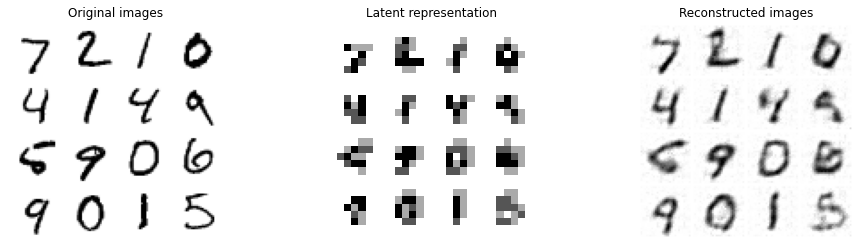

Epoch 6


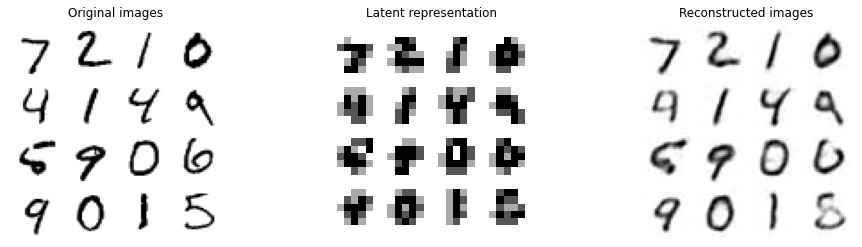

Epoch 11


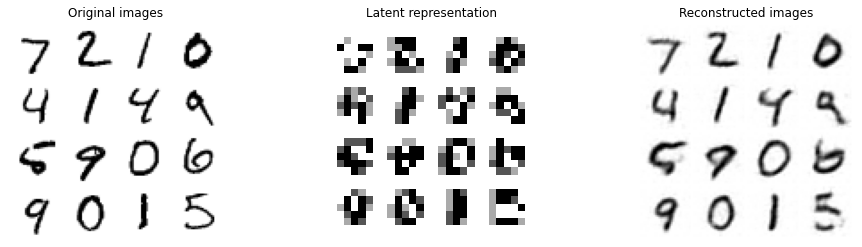

Epoch 16


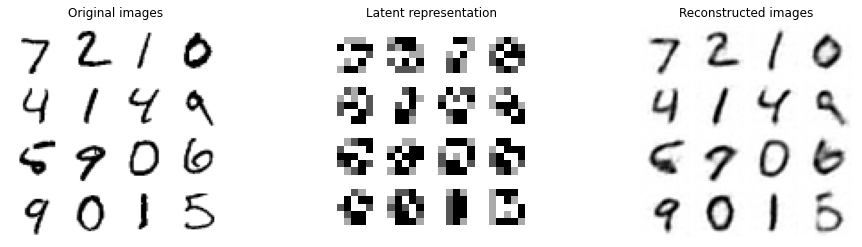

Epoch 21


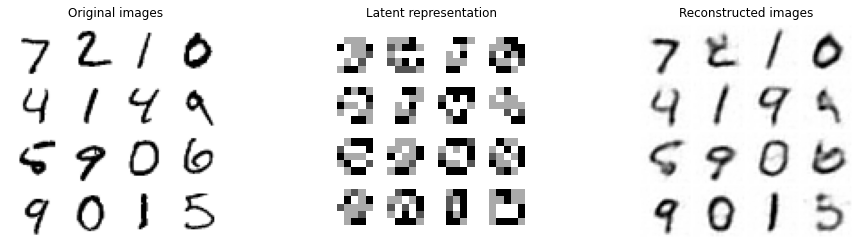

Epoch 26


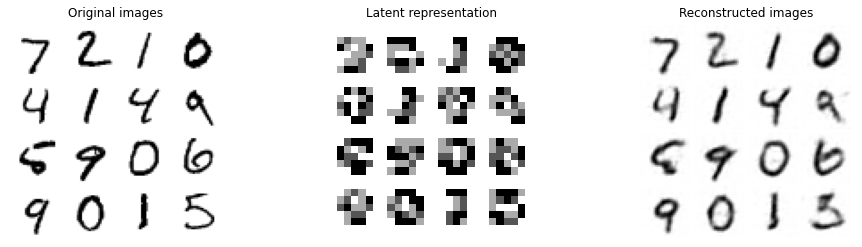

Epoch 31


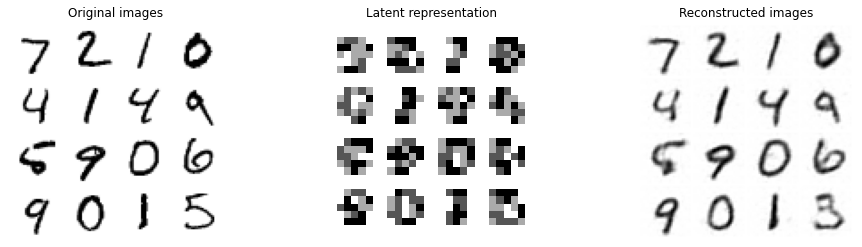

Epoch 36


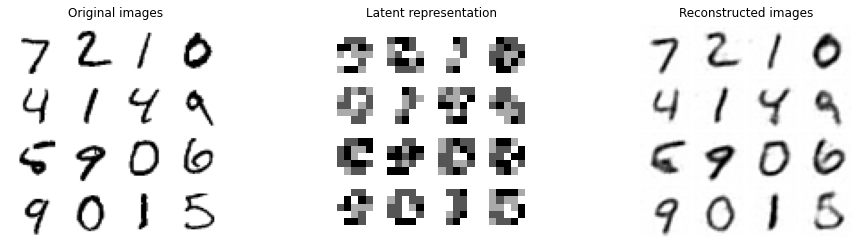

Epoch 41


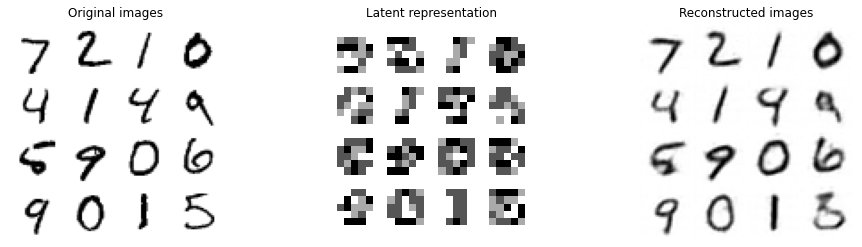

Epoch 46


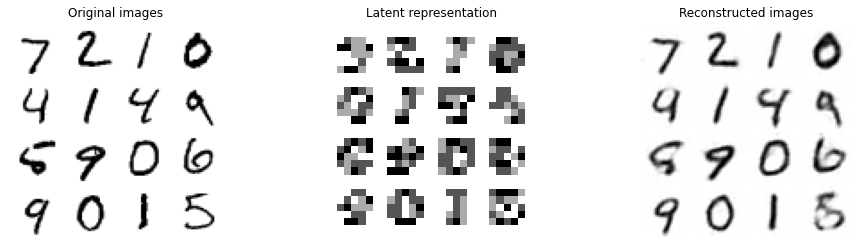

Epoch 50


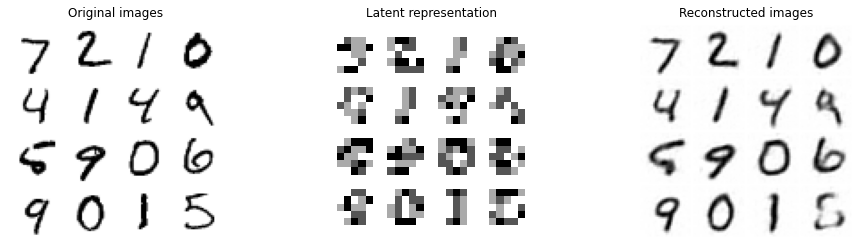

VQVAEStrided(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(16, 16, kernel_size=(4, 4), stride=(3, 3), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ResBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (6): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ResBlock(
      (conv1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    )
    (8): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (vq): VQ(
    (embedding): Embed

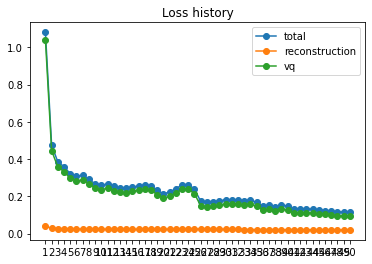

In [199]:
model = VQVAEStrided(1, 4, 16, 16, True, 0.2, res_stride=1)
model.to(device)
train_vqvae(num_embeddings=4, embedding_size=16, res_hidden_channels=16, decoder_bn=True,
            commitment_cost=0.2, num_epochs=50, batch_size=32, lr=1e-3, plot_final_only=False, model=model)

In [64]:
device

device(type='cuda')

---
## PixelCNN

In [41]:
# use PixelCNN as model for the prior probability. To do so use pixel pixel of last exercise to predict the embedding classes.

compressed_image_size = 7
embedding_size = 8
num_embeddings = 10

In [42]:
class MaskedConv(nn.Conv2d):
    def __init__(self, mask_type, *args, **kwargs):
        super(MaskedConv, self).__init__(*args, **kwargs)
        self.mask_type = mask_type   

        self.register_buffer('mask', self.weight.data.clone())  

        in_channels, out_channels, height, width = self.weight.size()

        self.mask.fill_(1)
        
        y_center, x_center = height // 2, width // 2

        if mask_type =='A':
            # center pixel masked
            self.mask[:, :, y_center + 1:, :] = 0.0
            self.mask[:, :, y_center:, x_center:] = 0.0
        else: 
            # center pixel not masked
            self.mask[:, :, y_center + 1:, :] = 0.0
            self.mask[:, :, y_center:, x_center + 1:] = 0.0

        
    def forward(self, x):
        self.weight.data *= self.mask.to(device) 
        return super(MaskedConv, self).forward(x)


class PixelCNN(nn.Module):
    def __init__(self, cfg):
        super(PixelCNN, self).__init__()
        
        self.kernel_size = cfg.kernel_size
        self.hidden_layers = cfg.hidden_layers
        n_channels = cfg.channel_dimention
        
        self.conv2d_A = MaskedConv('A', 1, n_channels, self.kernel_size, 1, self.kernel_size // 2, bias=False)
        self.BatchNorm2d = nn.BatchNorm2d(n_channels)
        self.relu_1 = nn.ReLU(True)

        self.convs2d_B  = nn.ModuleList()
        self.batch_norms = nn.ModuleList()
        self.relus = nn.ModuleList()
        for i in range(self.hidden_layers): 
            self.convs2d_B.append(MaskedConv('B', n_channels, n_channels, self.kernel_size, 1, self.kernel_size // 2, bias=False))
            self.batch_norms.append(nn.BatchNorm2d(n_channels))
            self.relus.append(nn.ReLU(True))
            
        self.out = nn.Conv2d(n_channels, num_embeddings, 1)
    
    def forward(self, x):
        x = self.conv2d_A(x)
        x = self.BatchNorm2d(x)
        x = self.relu_1(x)

        for i in range(self.hidden_layers):
            x = self.convs2d_B[i](x)
            x = self.batch_norms[i](x)
            x = self.relus[i](x)

        x = self.out(x)
        return x

def sample_pixel_cnn(model, n, num_input_channels):
    model.eval()
    with torch.no_grad():
        samples = torch.zeros((n, num_input_channels, compressed_image_size, compressed_image_size), dtype=torch.float, device=device)
        for i in range(compressed_image_size):
            for j in range(compressed_image_size):
                for k in range(num_input_channels):
                    output = model(samples)
                    probs = F.softmax(output[:, :, i, j], dim=-1).data
                    samples[:, :, i, j] = torch.multinomial(probs, 1).float()
        return samples


class Config():
    def __init__(self):
        self.epochs = 20
        self.batch_size = 32
        self.kernel_size = 7
        self.channel_dimention = 64
        self.hidden_layers = 6
        self.learning_rate = 1e-4
        self.reg = 1e-4


### Then train Pixel CNN on the compressed images from vqvae

PixelCNN epoch 1/20 ......................................Train loss:  0.9565418621277679
PixelCNN epoch 2/20 ......................................Train loss:  0.8109065200955157
PixelCNN epoch 3/20 ......................................Train loss:  0.7610297441057444
PixelCNN epoch 4/20 ......................................Train loss:  0.7308738550502922
PixelCNN epoch 5/20 ......................................Train loss:  0.7104781700389452
PixelCNN epoch 6/20 ......................................Train loss:  0.6957291419870311
PixelCNN epoch 7/20 ......................................Train loss:  0.6846548844343651
PixelCNN epoch 8/20 ......................................Train loss:  0.6756719516468731
PixelCNN epoch 9/20 ......................................Train loss:  0.6679015571546499
PixelCNN epoch 10/20 ......................................Train loss:  0.6608975457203411
PixelCNN epoch 11/20 ......................................Train loss:  0.6545660186001976
PixelCNN

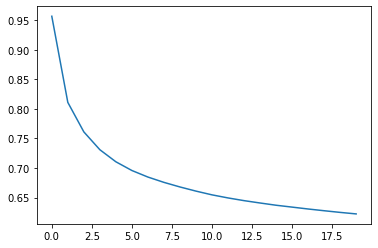

In [43]:
n_classes = num_embeddings
cfg = Config()

pixelCNN = PixelCNN(cfg=cfg).to(device)

optimizer = optim.Adam(pixelCNN.parameters(), cfg.learning_rate, weight_decay=cfg.reg)
criterion = nn.CrossEntropyLoss()

train_nll_history = []
val_nll_history = []

num_epochs = cfg.epochs

train_loader = DataLoader(train_dataset, batch_size=cfg.batch_size, shuffle=True)

for epoch in range(num_epochs):
    print(f'PixelCNN epoch {epoch + 1}/{num_epochs} ', end='')
    
    pixelCNN.train()
    train_loss = 0
    n_batches = 0

    for i, minibatch in enumerate(train_loader):
        optimizer.zero_grad()

        x = minibatch[0].to(device)

        x_recon, quantized, indices, _ = vqvae(x)

        inputs = indices
        targets = Variable(inputs[:, 0, :, :])
        targets = targets.long()

        inputs = inputs.to(device).float()
        targets = targets.to(device)

        outputs = pixelCNN(inputs)

        nll = criterion(outputs, targets)
        nll.backward()

        optimizer.step()
        
        train_loss += nll.item() / np.log(2.) / 2.
        
        if i % 50 == 0:
            print('.', end='')

        n_batches += 1

    train_loss /= n_batches
    train_nll_history.append(train_loss)

    print("Train loss: ", train_loss)
    
    pixelCNN.eval()


plt.plot(train_nll_history)
torch.save(pixelCNN.state_dict(),'/home/syslink/Documents/gm/ex4/correct_pixelcnn.pt')

In [46]:
class PixelCNNVQVAE(nn.Module):
    
    def __init__(self, pixelcnn, vqvae, image_size):
        super().__init__()
        self.pixelcnn = pixelcnn
        self.vqvae = vqvae
        self.image_size = image_size
    
    def sample_prior(self, batch_size):
        indices = sample_pixel_cnn(self.pixelcnn, batch_size, 1).squeeze(dim=1).long()
        self.vqvae.eval()
        with torch.no_grad():
            quantized = self.vqvae.embed(indices)
            quantized = quantized.permute(0, 3, 1, 2)
        return quantized, indices
    
    def sample(self, batch_size):
        quantized, indices = self.sample_prior(batch_size)
        with torch.no_grad():
            x_recon = self.vqvae.decode(quantized)
        return x_recon, quantized, indices

def plot_latents_with_pixelcnn(model):
    model.eval()
    with torch.no_grad():
        samples = []
        indices = []
        for _ in range(64):
            sample, quantized, index = model.sample(1)
            samples.append(sample)
            indices.append(index)

        x_recon = torch.stack(samples)[:, 0, :, :, :]
    
    plt.imshow(torchvision.utils.make_grid(
        torch.clamp(1 - x_recon, 0., 1.), nrow=8, pad_value=1).permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.show()



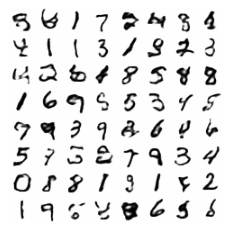

In [47]:
model = PixelCNNVQVAE(pixelCNN, vqvae, compressed_image_size)
plot_latents_with_pixelcnn(model)